# OMM: d$_{62}$DPPC / LPS + LDL

# Import Libraries & Set up Model

In [76]:
# use matplotlib for plotting
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import os.path
import warnings

# Filter out FutureWarnings
warnings.filterwarnings("ignore", category=FutureWarning)

import refnx, scipy

# the analysis module contains the curvefitting engine
from refnx.analysis import CurveFitter, Objective, Parameter, GlobalObjective, Parameters, process_chain, Transform, load_chain, possibly_create_parameter

# the reflect module contains functionality relevant to reflectometry
from refnx.reflect import SLD, ReflectModel, Structure, LipidLeaflet, Component, sld_profile

# the ReflectDataset object will contain the data
from refnx.dataset import ReflectDataset

import periodictable
from multiprocessing import Pool

# version numbers used in this analysis
refnx.version.version, scipy.version.version, np.version.version


('0.1.41', '1.11.4', '1.26.3')

In [77]:
# Load datasets for the bilayer at 37C before the addition of LDL and after the incubation and rinse
S1_data_d2o_rt = ReflectDataset('55756_57+55776_S2_37C_D2O.dat')
S1_data_d2o_rt.name = "D2O_dataset"
S1_data_smw_rt = ReflectDataset('55781_82_S2_37C_SMW.dat')
S1_data_smw_rt.name = "SMW_dataset"
S1_data_h2o_rt = ReflectDataset('55793_94_S2_37C_H2O.dat')
S1_data_h2o_rt.name = "H2O_dataset"

S1_data_d2o_LDL = ReflectDataset('55850_51_S2_37C_D2O_LDL_8h_rinse.dat')
S1_data_d2o_LDL.name = "D2O_dataset"
S1_data_smw_LDL = ReflectDataset('55846_47_S2_37C_SMW_LDL_8h_rinse.dat')
S1_data_smw_LDL.name = "SMW_dataset"
S1_data_h2o_LDL = ReflectDataset('55842_43_S2_37C_H2O_LDL_8h_rinse.dat')
S1_data_h2o_LDL.name = "H2O_dataset"


In [78]:
# let the SiO2 slabs be defined outside this Component.
# the Bilayer Component describes layers of the bilayer
class Bilayer(Component):
    def __init__(self, *pars):
        super().__init__(name='paracini')
        
        self.pnames = ['inner_head_thick', 'inner_head_sld', 'inner_head_hydration', 
                       'inner_tails_thick', 'inner_tails_sld', 
                       'outer_tails_thick', 'outer_tails_sld', 
                       'tails_hydration',
                       'outer_head_sld_ratio', 'outer_head_sld_d2o', 'outer_rough', 'core_thickness', 'core_hydration',]
        
        self._pars = [possibly_create_parameter(p, name=pname) for pname, p in zip(self.pnames, pars)]        

        assert len(self._pars) == len(self.pnames) == 13
        
        for pname, p in zip(pnames, self._pars):
            setattr(self, pname, p)
    
        
        self._parameters = Parameters(data = self._pars, name=self.name)

    @property
    def parameters(self):
        return self._parameters

    def slabs(self, structure=None):
        """
        Slab representation of this component. See :class:`Component.slabs`
        """
        solvent = complex(structure.solvent)
        
        # calculate mole fraction of D2O from the bulk SLD
        rho_d2o = 6.35
        rho_h2o = -0.56
        d2o_molfr = (solvent - rho_h2o)/(rho_d2o - rho_h2o);
        
                
        # Use D2O mol fraction to calculate SLD that exchange in D2O, the _ratio parameter define the ratios between the SLD in D2O and the SLD in H2O
        outer_head_sld = (self.outer_head_sld_d2o.value * d2o_molfr)
        outer_head_sld += (1 - d2o_molfr)*(self.outer_head_sld_ratio.value * self.outer_head_sld_d2o.value)
        
        # Account for bilayer hydration
        rhoInnerHead = self.inner_head_hydration.value * solvent
        rhoInnerHead += (1 - self.inner_head_hydration.value) * self.inner_head_sld.value

        rhoInnerTails = self.tails_hydration.value * solvent 
        rhoInnerTails += (1 - self.tails_hydration.value) * self.inner_tails_sld.value

        rhoOuterTails = self.tails_hydration.value * solvent 
        rhoOuterTails += (1- self.tails_hydration.value) * self.outer_tails_sld.value
        
        rhoOuterHead = self.core_hydration.value * solvent
        rhoOuterHead += (1 - self.core_hydration.value) * outer_head_sld
        
        
        orough = self.outer_rough.value


        
        bilayer = np.array([
            [self.inner_head_thick.value, np.real(rhoInnerHead), np.imag(0), orough, 0],
            [self.inner_tails_thick.value, np.real(rhoInnerTails), np.imag(0), orough, 0],
            [self.outer_tails_thick.value, np.real(rhoOuterTails), np.imag(0), orough, 0],
            [self.core_thickness.value, np.real(rhoOuterHead), np.imag(0), orough, 0],
        ], dtype=float)
    
        return np.r_[bilayer]
       

In [79]:
pnames = [  'inner_head_thick', 'inner_head_sld', 'inner_head_hydration', 
            'inner_tails_thick', 'inner_tails_sld', 
            'outer_tails_thick', 'outer_tails_sld', 
            'tails_hydration',
            'outer_head_sld_ratio', 'outer_head_sld_d2o', 'outer_rough', 'core_thickness', 'core_hydration',]
# Create Parameter objects to share between conditions. Reuse a Parameter object if it's common.
# if it's not common then create a new Parameter object for that condition.

base_pars = [('inner_head_thick',      9, True, (5, 15)),
             ('inner_head_sld',        1.9, False, (1.8, 2.2)),
             ('inner_head_hydration',  0.32, True, (0.2, 0.6)),
             ('inner_tails_thick',     16, True, (12, 20)),
             ('inner_tails_sld',       7, True, (4, 8)),             
             ('outer_tails_thick',     14,   True, (12, 20)),
             ('outer_tails_sld',       -0.3,    True, (-0.4, 2)),
             ('tails_hydration',       0.02, True, (0, 0.5)),
             ('outer_head_sld_ratio',  0.5,  False, (0.4, 0.6)),
             ('outer_head_sld_d2o',    4.8,  True, (4, 7)),
             ('outer_rough',           5,    True, (3, 8)),
             ('core_thickness',        28,   True, (20, 40)),
             ('core_hydration',        0.48, True, (0, 1)),
            ]

pars = {p[0]: Parameter(value=p[1], vary=p[2], bounds=p[3], name=p[0]) for p in base_pars}

a = Bilayer(*(pars.values())) 

In [80]:
# Set bounds and initial values for the bilayer + LDL


#Create the new Parameters for Bilayer + LDL that are not shared/common with the previous set


inner_head_thick_LDL = Parameter(8, vary=True, name='inner_head_thick_LDL', bounds=(5, 15))
pars['inner_head_thick'] = inner_head_thick_LDL

inner_head_sld_LDL = Parameter(1.9, vary=True, name='inner_head_sld_LDL', bounds=(1.8, 2))
pars['inner_head_sld'] = inner_head_sld_LDL

inner_head_hydration_LDL = Parameter(0.3, vary=True, name='inner_head_hydration_LDL', bounds=(0.2, 0.6))
pars['inner_head_hydration'] = inner_head_hydration_LDL

inner_tails_thick_LDL = Parameter(14, vary=True, name='inner_tails_thick_LDL', bounds=(10, 20))
pars['inner_tails_thick'] = inner_tails_thick_LDL

inner_tails_sld_LDL = Parameter(6, vary=True, name='inner_tails_sld_LDL', bounds=(4, 8))
pars['inner_tails_sld'] = inner_tails_sld_LDL

outer_tails_thick_LDL = Parameter(12, vary=True, name='outer_tails_thick_LDL', bounds=(10, 20))
pars['outer_tails_thick'] = outer_tails_thick_LDL

outer_tails_sld_LDL = Parameter(-0.3, vary=True, name='outer_tails_sld_LDL', bounds=(-0.5, 2))
pars['outer_tails_sld'] = outer_tails_sld_LDL

tails_hydration_LDL = Parameter(0, vary=True, name='tails_hydration_LDL', bounds=(0, 0.3))
pars['tails_hydration'] = tails_hydration_LDL

core_thickness_LDL = Parameter(25, vary=True, name='core_thickness_LDL', bounds=(20, 35))
pars['core_thickness'] = core_thickness_LDL

core_hydration_LDL = Parameter(0.3, vary=True, name='core_hydration_LDL', bounds=(0.2, 0.7))
pars['core_hydration'] = core_hydration_LDL

outer_rough_LDL = Parameter(4, vary=True, name='outer_rough_LDL', bounds=(2, 8))
pars['outer_rough'] = outer_rough_LDL

b = Bilayer(*(pars.values())) 

In [81]:
#Set substrate and bulk solvent parameters
si = SLD(2.07, 'Si')
sio2 = SLD(3.47, 'SiO2')

d2o = SLD(6.36, 'D2O')
h2o = SLD(-0.56, 'H2O')
smw = SLD(2.07, 'SMW')

d2o.real.setp(6.25, bounds=(6, 6.36), vary=True)
d2o.real.name='D2O SLD'

smw.real.setp(2.07, bounds=(1.5, 3), vary=True)
smw.real.name='SMW SLD'

h2o.real.setp(-0.56, bounds=(-0.56, 1), vary=True)
h2o.real.name='H2O SLD'


## Shared SiO2 layer ##
S1_l_sio2 = sio2(15, 3)

S3_l_sio2 = sio2(15, 3)

S1_l_sio2.thick.name = 'S1 SiO2 Thickness'
S1_l_sio2.thick.setp(13, bounds=(2, 30), vary=True)
S1_l_sio2.rough.name = name='S1 SiO2 Roughness'
S1_l_sio2.rough.setp(4, bounds=(0, 7), vary=True)
S1_l_sio2.vfsolv.name = 'S1 SiO2 Solvation'
S1_l_sio2.vfsolv.setp(0.1, bounds=(0., 0.5), vary=True)


# Bilayer
S1_s_d2o_rt =  si  | S1_l_sio2 | a | d2o(0, a.outer_rough)
S1_s_smw_rt =  si  | S1_l_sio2 | a | smw(0, a.outer_rough)
S1_s_h2o_rt =  si  | S1_l_sio2 | a | h2o(0, a.outer_rough)

# Bilayer + LDL
S1_s_d2o_LDL =  si  | S1_l_sio2 | b | d2o(0, b.outer_rough)
S1_s_smw_LDL =  si  | S1_l_sio2 | b | smw(0, b.outer_rough)
S1_s_h2o_LDL =  si  | S1_l_sio2 | b | h2o(0, b.outer_rough)




In [82]:
# Common scale and background parameters
S1_scale_rt = Parameter(1, 'S1_scale_rt')
S1_scale_rt.setp(0.8158, bounds=(0.8, 1.2), vary=True)
S1_scale_LDL = Parameter(1, 'S1_scale_37')
S1_scale_LDL.setp(0.8158, bounds=(0.8, 1.2), vary=True)




bkg1 = Parameter(1e-6, 'Bkg1')
bkg1.setp(1e-6, bounds=(1e-8, 6e-5), vary=True)

bkg2 = Parameter(1e-6, 'Bkg2')
bkg2.setp(1e-6, bounds=(1e-8, 6e-5), vary=True)

bkg3 = Parameter(1e-6, 'Bkg3')
bkg3.setp(1e-6, bounds=(1e-8, 6e-5), vary=True)




S1_model_d2o_rt =  ReflectModel(S1_s_d2o_rt,  scale=S1_scale_rt,  bkg=bkg1,    dq=4, dq_type='constant')
S1_model_smw_rt =  ReflectModel(S1_s_smw_rt,  scale=S1_scale_rt,  bkg=bkg2,    dq=4, dq_type='constant')
S1_model_h2o_rt =  ReflectModel(S1_s_h2o_rt,  scale=S1_scale_rt,  bkg=bkg3,    dq=4, dq_type='constant')   
S1_model_d2o_LDL =  ReflectModel(S1_s_d2o_LDL,  scale=S1_scale_LDL,  bkg=bkg1,    dq=4, dq_type='constant')
S1_model_smw_LDL =  ReflectModel(S1_s_smw_LDL,  scale=S1_scale_LDL,  bkg=bkg2,    dq=4, dq_type='constant')
S1_model_h2o_LDL =  ReflectModel(S1_s_h2o_LDL,  scale=S1_scale_LDL,  bkg=bkg3,    dq=4, dq_type='constant')


In [83]:
S1_objective_d2o_rt = Objective(  S1_model_d2o_rt,   S1_data_d2o_rt)
S1_objective_smw_rt = Objective(  S1_model_smw_rt,   S1_data_smw_rt)
S1_objective_h2o_rt = Objective(  S1_model_h2o_rt,   S1_data_h2o_rt)
S1_objective_d2o_LDL = Objective(  S1_model_d2o_LDL,   S1_data_d2o_LDL)
S1_objective_smw_LDL = Objective(  S1_model_smw_LDL,   S1_data_smw_LDL)
S1_objective_h2o_LDL = Objective(  S1_model_h2o_LDL,   S1_data_h2o_LDL)


S1_objective_h2o_rt.weighted = S1_objective_smw_rt.weighted = S1_objective_d2o_rt.weighted = S1_objective_h2o_LDL.weighted = S1_objective_smw_LDL.weighted = S1_objective_d2o_LDL.weighted = True

global_objective = GlobalObjective([S1_objective_d2o_rt,  S1_objective_smw_rt,   S1_objective_h2o_rt, 
                                    S1_objective_d2o_LDL,  S1_objective_smw_LDL,   S1_objective_h2o_LDL,])


# Structure

In [135]:
S1_slabs_rt_d2o = a.slabs( S1_s_d2o_rt)
S1_slabs_LDL_d2o = b.slabs( S1_s_d2o_LDL)


# Display the slab representations
print("\nS1 37C Bilayer Slabs D2O:")
print(S1_slabs_rt_d2o)

print("\nS1 LDL Bilayer Slabs D2O:")
print(S1_slabs_LDL_d2o)





S1 37C Bilayer Slabs D2O:
[[10.50871269  3.50893298  0.          6.24470806  0.        ]
 [15.335379    6.86684183  0.          6.24470806  0.        ]
 [17.87656662  2.35633834  0.          6.24470806  0.        ]
 [25.83166     5.29719928  0.          6.24470806  0.        ]]

S1 LDL Bilayer Slabs D2O:
[[ 9.70294579  3.23895258  0.          6.68491723  0.        ]
 [15.16812696  5.33557997  0.          6.68491723  0.        ]
 [16.80041578  1.5581891   0.          6.68491723  0.        ]
 [27.91391478  5.41799923  0.          6.68491723  0.        ]]


# Run Fit

In [85]:
fitter = CurveFitter(global_objective)

In [86]:
fitter.reset()

In [87]:
fitter.fit('differential_evolution', popsize=10, polish=True);

-5533.651753516218: : 147it [01:37,  1.51it/s]


# Plots

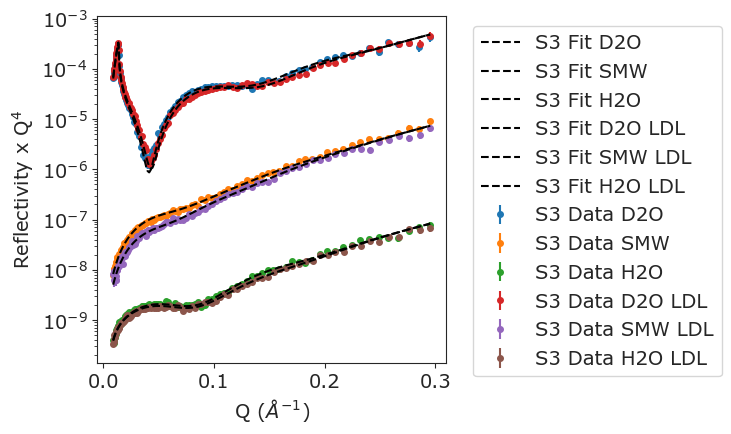

In [127]:
import matplotlib.pyplot as plt
import numpy as np  
plt.rcParams['font.family'] = 'Verdana'

# Define the offsets for each dataset
offsets = [4, 2, 0, 4, 2, 0]

marksize = 4
color = 'black'

# Define the scaling function
def scale_y(y, x):
    return y * x**4  # for R*Q^4

# Apply vertical offset
def apply_vertical_offset(y, offset):
    return y * 10**offset

fig, ax = plt.subplots(figsize=(4.5, 4.5))  

# Define a list of objectives and labels for S1
S1_objectives = [S1_objective_d2o_rt, S1_objective_smw_rt,  S1_objective_h2o_rt, S1_objective_d2o_LDL, S1_objective_smw_LDL,  S1_objective_h2o_LDL]
S1_labels = ['D2O', 'SMW', 'H2O', 'D2O LDL', 'SMW LDL', 'H2O LDL']

# Loop over each objective and plot for S1
for i, S1_obj in enumerate(S1_objectives):
    x_S1, y_S1, y_err_S1 = S1_obj.data.x, S1_obj.data.y, S1_obj.data.y_err

    scaled_y_S1 = scale_y(apply_vertical_offset(y_S1, offsets[i]), x_S1)
    scaled_y_err_S1 = scale_y(apply_vertical_offset(y_err_S1, offsets[i]), x_S1)
    scaled_model_y_S1 = scale_y(apply_vertical_offset(S1_obj.model(x_S1), offsets[i]), x_S1)

    ax.errorbar(x_S1, scaled_y_S1, scaled_y_err_S1, label=f'S3 Data {S1_labels[i]}', fmt='o', markersize=marksize)
    ax.plot(x_S1, scaled_model_y_S1, label=f'S3 Fit {S1_labels[i]}', linestyle='--', color=color, zorder=10)

# Set y-axis scaling
ax.set_yscale('log')

# Set x-axis scaling
ax.set_xscale('linear')

# Set labels and legend
ax.set_xlabel('Q ($Å^{-1}$)', fontsize=14)
ax.set_ylabel('Reflectivity x Q$^{4}$', fontsize=14)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# ax.set_title('LPS + LDL')


# Optionally, save the figure
# plt.savefig('LPS_LDL_Fits', dpi=300, bbox_inches='tight')

plt.show()


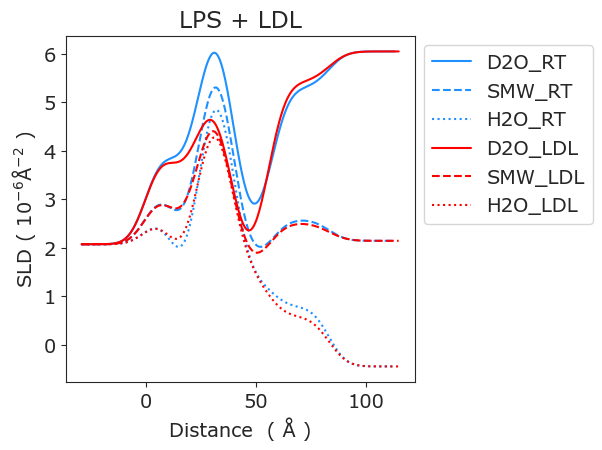

In [124]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'Verdana'
plt.rcParams['font.size'] = 14 


fig, ax = plt.subplots(figsize=(4.5, 4.5))

# Plot S1 data on the left panel
ax.plot(*S1_s_d2o_rt.sld_profile(),  label='D2O_RT'  , linestyle='-', color= 'dodgerblue')
ax.plot(*S1_s_smw_rt.sld_profile(),  label='SMW_RT'  , linestyle='--', color='dodgerblue')
ax.plot(*S1_s_h2o_rt.sld_profile(),  label='H2O_RT'  , linestyle=':', color= 'dodgerblue')

ax.plot(*S1_s_d2o_LDL.sld_profile(),  label='D2O_LDL'  , linestyle='-', color= 'red')
ax.plot(*S1_s_smw_LDL.sld_profile(),  label='SMW_LDL'  , linestyle='--', color='red')
ax.plot(*S1_s_h2o_LDL.sld_profile(),  label='H2O_LDL'  , linestyle=':', color= 'red')



ax.set_ylabel("SLD ( $10^{-6}$Å$^{-2}$ )")
ax.set_xlabel("Distance  ( Å )")
ax.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax.set_title('LPS + LDL')



# Optionally, save the figure
# plt.savefig('LPS_LDL_SLD', dpi=300, bbox_inches='tight')

plt.show()


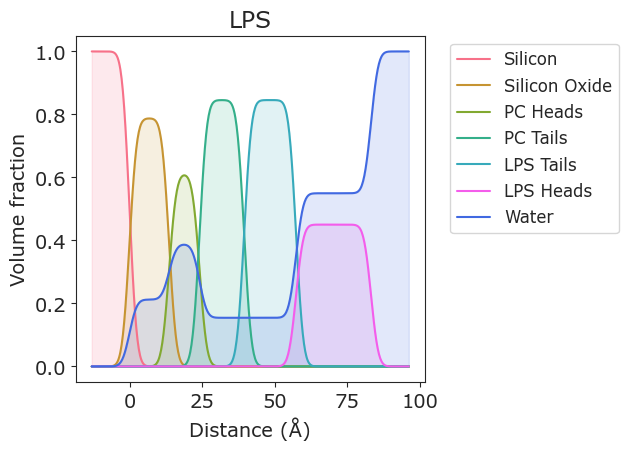

In [139]:
#Volume fraction plot of the bilayer at 37C
import seaborn as sns

# Set style
sns.set_style('ticks')

# Add custom labels 
custom_labels = ["Silicon", "Silicon Oxide", "PC Heads", "PC Tails", "LPS Tails", 'LPS Heads', "Water"] 
plt.rcParams['font.family'] = 'Verdana'
plt.rcParams['font.size'] = 14 



def create_vfp(structure, solvent_slab=-1, roughness=2, labels=None):
    _slabs = structure.slabs().copy()

    if roughness is not None:
        _slabs[:, 3] = roughness
        
    # Create an array of hydration values for each slab in the structure
    vf = np.zeros(len(_slabs))

    # Assign hydration values to the layers of the Bilayer component
    vf[0:6] = np.array([  0,
                          S1_l_sio2.vfsolv,
                          a.inner_head_hydration.value,
                          a.tails_hydration.value,
                          a.tails_hydration.value,
                          a.core_hydration.value, ])
                                                                       

    vf = 1 - vf
    
    nvfp = len(_slabs)
    
    z, sldp = sld_profile(_slabs) 
    vfp = np.zeros((nvfp, len(z)), float)
    
    for i in range(len(_slabs)):
        _slabs[:, 1:3] = 0
        _slabs[i, 1] = vf[i]
        _vfp = sld_profile(_slabs, z=z)[1]
        vfp[i] = _vfp
    
    # fix up the solvent vfp
    _slabs[:, 1] = 1 - vf


    _slabs[solvent_slab, 1] = 1
    _vfp = sld_profile(_slabs, z=z)[1]
    vfp[solvent_slab] = _vfp

    return z, vfp

z, vfp = create_vfp(S1_s_d2o_rt, solvent_slab=-1, labels=custom_labels)

# Get the "Paired" color palette from Seaborn
colors = sns.color_palette('husl', len(vfp))

# Swap the colors of the last two elements
colors[-2], colors[-1] = colors[-1], colors[-2]

# Set the color of the last element to 'royalblue'
colors[-1] = 'royalblue'

fig3 = plt.figure(figsize=(4.5, 4.5))

for i in range(len(vfp)):
    sns.lineplot(x=z, y=vfp[i], label=custom_labels[i], color=colors[i])
    plt.fill_between(z, 0, vfp[i], color=colors[i], alpha=0.15)  # Shading under the line plot
    plt.ylabel('Volume fraction')
    plt.xlabel('Distance (Å)')
    plt.xticks()  
    plt.yticks()  

# Adding a legend
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.title('LPS')


# plt.savefig('LPS_LDL_VF_r=2.png', dpi=300, bbox_inches='tight')
plt.show()

# --------------------------------EXPORT-----------------------------------------

import pandas as pd

# Function to create the volume fraction plot data
def create_vfp_data(z, vfp, labels):
    # Initialize a dictionary to store data
    data = {'Distance (Å)': z}
    
    # Add each volume fraction profile to the dictionary
    for i, label in enumerate(labels):
        data[label] = vfp[i]
    
    return pd.DataFrame(data)

# Generate the volume fraction profile data
z, vfp = create_vfp(S1_s_d2o_rt, solvent_slab=-1, labels=custom_labels)

# Create a DataFrame from the volume fraction profile data
vfp_data = create_vfp_data(z, vfp, custom_labels)

# Export the DataFrame to a CSV file
vfp_data.to_csv('S1_37C_volume_fraction_profiles.csv', index=False)

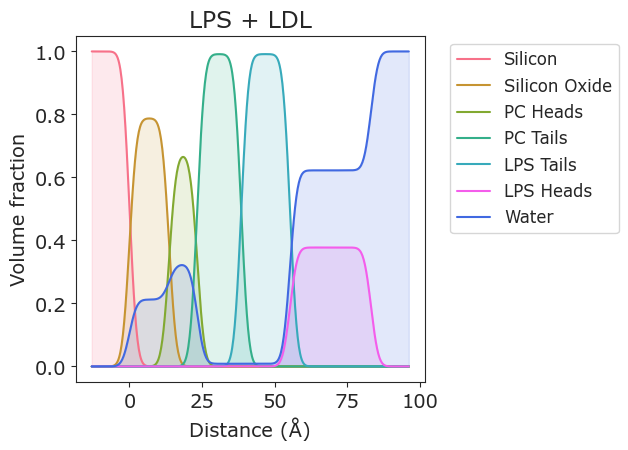

In [138]:
#Volume fraction plot of the bilayer at 37C + LDL
import seaborn as sns

# Set style
sns.set_style('ticks')

# Add custom labels to this list
custom_labels = ["Silicon", "Silicon Oxide", "PC Heads", "PC Tails", "LPS Tails", 'LPS Heads', "Water"]  # Example labels
plt.rcParams['font.family'] = 'Verdana'
plt.rcParams['font.size'] = 14 



def create_vfp(structure, solvent_slab=-1, roughness=2, labels=None):
    _slabs = structure.slabs().copy()

    if roughness is not None:
        _slabs[:, 3] = roughness
        
    # Create an array of hydration values for each slab in the structure
    vf = np.zeros(len(_slabs))

    # Assign hydration values only to the layers of the Bilayer component
    vf[0:6] = np.array([  0,
                          S1_l_sio2.vfsolv,
                          b.inner_head_hydration.value,
                          b.tails_hydration.value,
                          b.tails_hydration.value,
                          b.core_hydration.value, ])
                                                                       

    vf = 1 - vf
    
    nvfp = len(_slabs)
    
    z, sldp = sld_profile(_slabs) 
    vfp = np.zeros((nvfp, len(z)), float)
    
    for i in range(len(_slabs)):
        _slabs[:, 1:3] = 0
        _slabs[i, 1] = vf[i]
        _vfp = sld_profile(_slabs, z=z)[1]
        vfp[i] = _vfp
    
    # fix up the solvent vfp
    _slabs[:, 1] = 1 - vf


    _slabs[solvent_slab, 1] = 1
    _vfp = sld_profile(_slabs, z=z)[1]
    vfp[solvent_slab] = _vfp

    return z, vfp

z, vfp = create_vfp(S1_s_d2o_LDL, solvent_slab=-1, labels=custom_labels)

# Get the "Paired" color palette from Seaborn
colors = sns.color_palette('husl', len(vfp))

# Swap the colors of the last two elements
colors[-2], colors[-1] = colors[-1], colors[-2]

# Set the color of the last element to 'royalblue'
colors[-1] = 'royalblue'

fig3 = plt.figure(figsize=(4.5, 4.5))

for i in range(len(vfp)):
    sns.lineplot(x=z, y=vfp[i], label=custom_labels[i], color=colors[i])
    plt.fill_between(z, 0, vfp[i], color=colors[i], alpha=0.15)  # Shading under the line plot
    plt.ylabel('Volume fraction')
    plt.xlabel('Distance (Å)')
    plt.xticks()  
    plt.yticks()  

# Adding a legend
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.title('LPS + LDL')


# plt.savefig('LPS_LDL_VF_LDLr=2.png', dpi=300, bbox_inches='tight')

plt.show()

# --------------------------------EXPORT-----------------------------------------

import pandas as pd

# Function to create the volume fraction plot data
def create_vfp_data(z, vfp, labels):
    # Initialize a dictionary to store data
    data = {'Distance (Å)': z}
    
    # Add each volume fraction profile to the dictionary
    for i, label in enumerate(labels):
        data[label] = vfp[i]
    
    return pd.DataFrame(data)

# Generate the volume fraction profile data
z, vfp = create_vfp(S1_s_d2o_LDL, solvent_slab=-1, labels=custom_labels)

# Create a DataFrame from the volume fraction profile data
vfp_data = create_vfp_data(z, vfp, custom_labels)

# Export the DataFrame to a CSV file
vfp_data.to_csv('S1_37C_LDL_volume_fraction_profiles.csv', index=False)

In [92]:
res = fitter.sample(20, nthin=150, pool=1)

100%|███████████████████████████████████████| 1500/1500 [07:37<00:00,  3.28it/s]


# Corner Plot

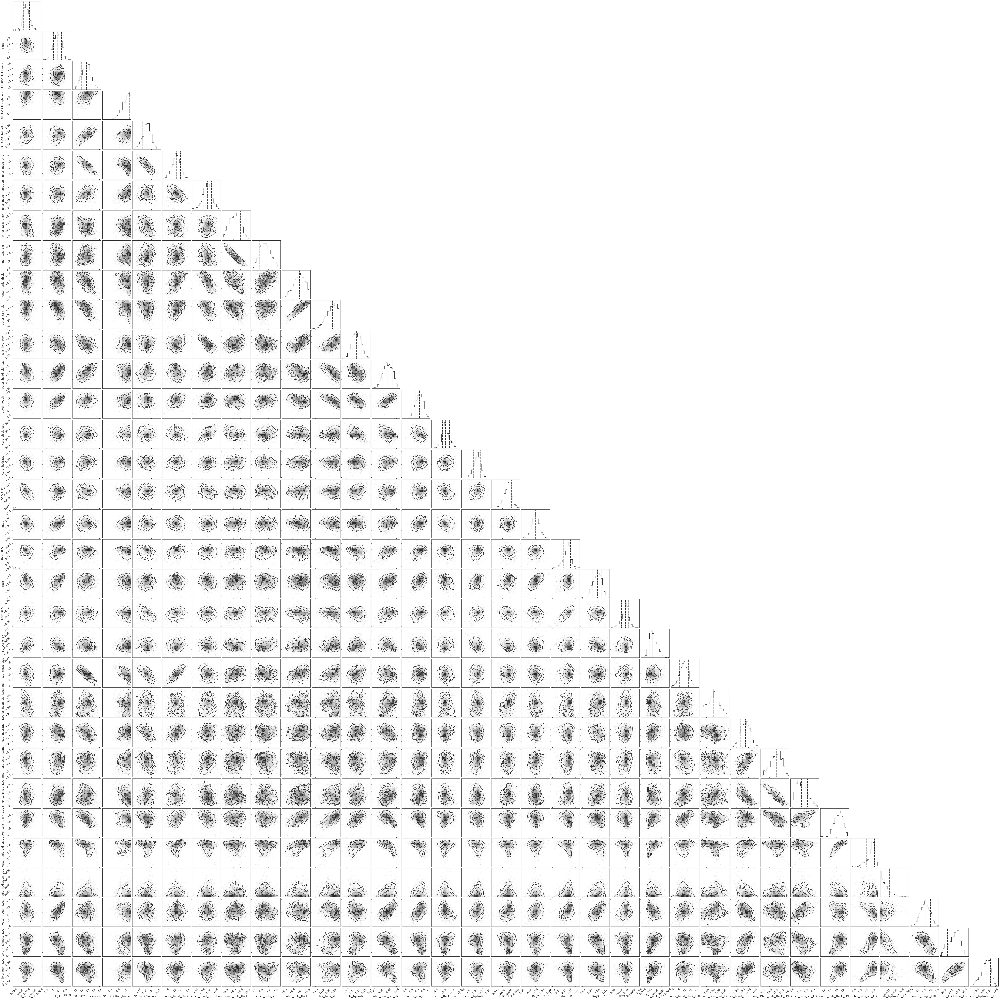

In [107]:
global_objective.corner();
# plt.savefig('LPS_LDL_corner')

# Sampled SLD Profiles

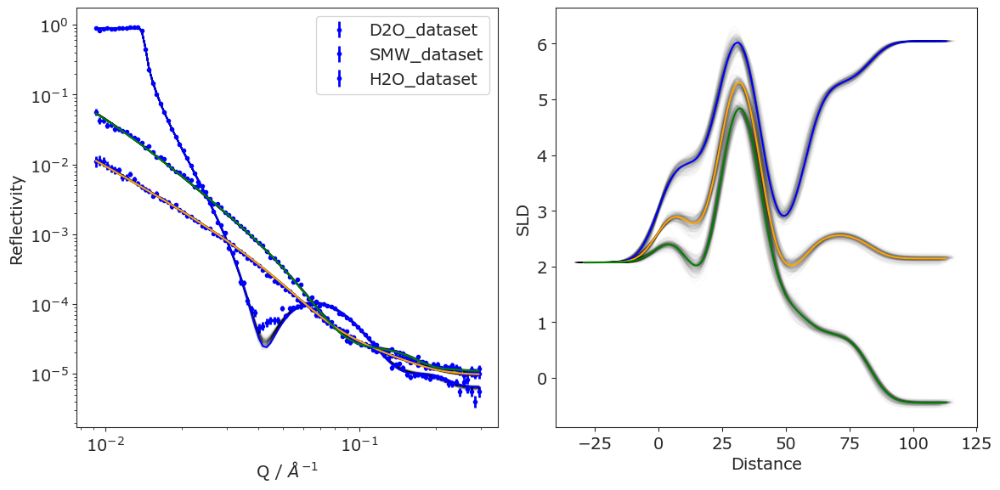

In [94]:
import matplotlib.pyplot as plt

# Create a figure with two subplots (1 row, 2 columns)
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plotting for Figure 1 on the first subplot
plt.sca(axs[0])  # Set the current axes to the first subplot
f, w = S1_objective_d2o_rt.plot(samples=200, fig=fig)
w.lines[-1].set_color('blue')
f, w = S1_objective_smw_rt.plot(samples=200, fig=fig)
w.lines[-1].set_color('orange')
f, w = S1_objective_h2o_rt.plot(samples=200, fig=fig)
w.lines[-1].set_color('green')

axs[0].set_yscale('log')
axs[0].set_xscale('log')
axs[0].set_xlabel('Q / $\AA^{-1}$')
axs[0].set_ylabel('Reflectivity')
axs[0].legend()

# Plotting for Figure 2 on the second subplot
plt.sca(axs[1])  # Set the current axes to the second subplot
f, w = S1_s_d2o_rt.plot(samples=200, fig=fig)
w.lines[-1].set_color('blue')
f, w = S1_s_smw_rt.plot(samples=200, fig=fig)
w.lines[-1].set_color('orange')
f, w = S1_s_h2o_rt.plot(samples=200, fig=fig)
w.lines[-1].set_color('green')

axs[1].set_yscale('linear')
axs[1].set_xscale('linear')
axs[1].set_xlabel('Distance')
axs[1].set_ylabel('SLD')
# axs[1].legend()

# Adjust layout
plt.tight_layout()

# Show the combined plot
plt.show()


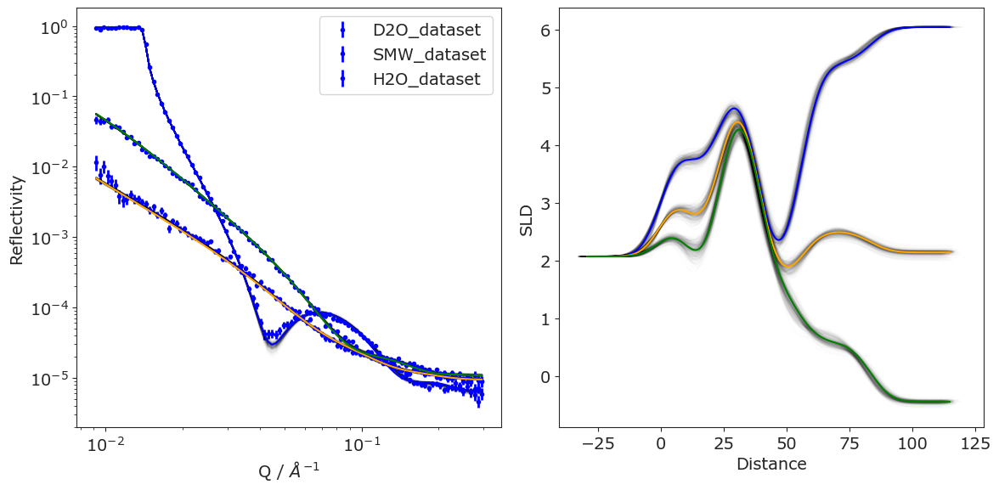

In [98]:
import matplotlib.pyplot as plt

# Create a figure with two subplots (1 row, 2 columns)
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plotting for Figure 1 on the first subplot
plt.sca(axs[0])  # Set the current axes to the first subplot
f, w = S1_objective_d2o_LDL.plot(samples=200, fig=fig)
w.lines[-1].set_color('blue')
f, w = S1_objective_smw_LDL.plot(samples=200, fig=fig)
w.lines[-1].set_color('orange')
f, w = S1_objective_h2o_LDL.plot(samples=200, fig=fig)
w.lines[-1].set_color('green')

axs[0].set_yscale('log')
axs[0].set_xscale('log')
axs[0].set_xlabel('Q / $\AA^{-1}$')
axs[0].set_ylabel('Reflectivity')
axs[0].legend()

# Plotting for Figure 2 on the second subplot
plt.sca(axs[1])  # Set the current axes to the second subplot
f, w = S1_s_d2o_LDL.plot(samples=200, fig=fig)
w.lines[-1].set_color('blue')
f, w = S1_s_smw_LDL.plot(samples=200, fig=fig)
w.lines[-1].set_color('orange')
f, w = S1_s_h2o_LDL.plot(samples=200, fig=fig)
w.lines[-1].set_color('green')

axs[1].set_yscale('linear')
axs[1].set_xscale('linear')
axs[1].set_xlabel('Distance')
axs[1].set_ylabel('SLD')
# axs[1].legend()

# Adjust layout
plt.tight_layout()

# Show the combined plot
plt.show()


# Fitted Parameters

In [111]:
#Display only the values that have been fitted plus other useful metrics
fitted_parameters = global_objective.parameters.varying_parameters() # List varying parameters
print(fitted_parameters)
print("number of fitted parameters: ", len(fitted_parameters)) 

number_of_exp_points =  len(S1_data_d2o_rt) +  len(S1_data_smw_rt) +  len(S1_data_h2o_rt) 
number_of_exp_points += len(S1_data_d2o_LDL) +  len(S1_data_smw_LDL) +  len(S1_data_h2o_LDL)  


print(" Number of experimental points: ", number_of_exp_points)
number_of_fitted_par = len(fitted_parameters)
print(" Number of fitted parameters: ", number_of_fitted_par)

chisquared =  S1_objective_d2o_rt.chisqr() +  S1_objective_smw_rt.chisqr() +  S1_objective_h2o_rt.chisqr()
chisquared += S1_objective_d2o_LDL.chisqr() +  S1_objective_smw_LDL.chisqr() +  S1_objective_h2o_LDL.chisqr()

print(" chi^2 = ", chisquared)


print(" Reduced chi^2 = ", chisquared / (number_of_exp_points - number_of_fitted_par ))

________________________________________________________________________________
Parameters:      None      
<Parameter: 'S1_scale_rt' , value=0.894639 +/- 0.00237, bounds=[0.8, 1.2]>
<Parameter:    'Bkg1'     , value=6.32897e-06 +/- 2.51e-07, bounds=[1e-08, 6e-05]>
<Parameter:'S1 SiO2 Thickness', value=13.6106 +/- 1.63 , bounds=[2.0, 30.0]>
<Parameter:'S1 SiO2 Roughness', value=6.0844 +/- 0.811, bounds=[0.0, 7.0]>
<Parameter:'S1 SiO2 Solvation', value=0.21227 +/- 0.0268, bounds=[0.0, 0.5]>
<Parameter:'inner_head_thick', value=10.5087 +/- 1.32 , bounds=[5.0, 15.0]>
<Parameter:'inner_head_hydration', value=0.388119 +/- 0.031, bounds=[0.2, 0.6]>
<Parameter:'inner_tails_thick', value=15.3354 +/- 1.22 , bounds=[12.0, 20.0]>
<Parameter:'inner_tails_sld', value=7.01685 +/- 0.313, bounds=[4.0, 8.0]>
<Parameter:'outer_tails_thick', value=17.8766 +/- 1.17 , bounds=[12.0, 20.0]>
<Parameter:'outer_tails_sld', value=1.6826 +/- 0.226, bounds=[-0.4, 2.0]>
<Parameter:'tails_hydration', value=0.154426

# Save Table of Values

In [112]:
import re
import pandas as pd

# Define a function to round numbers, preserving original notation
def round_number(value, decimals):
    try:
        original_value = float(value)
        # Check if the value is in scientific notation
        if "e" in value.lower():
            format_string = "{:." + str(decimals) + "e}"
        else:
            format_string = "{:." + str(decimals) + "f}"
        return format_string.format(original_value)
    except ValueError:
        return value

# Number of decimals to round to
decimals = 2  # You can change this to your desired number of decimal places

# Defining script_output
script_output = """
Parameters: 'instrument parameters'

________________________________________________________________________________
Parameters:      None      
<Parameter: 'S1_scale_rt' , value=0.894639 +/- 0.00237, bounds=[0.8, 1.2]>
<Parameter:    'Bkg1'     , value=6.32897e-06 +/- 2.51e-07, bounds=[1e-08, 6e-05]>
<Parameter:'S1 SiO2 Thickness', value=13.6106 +/- 1.63 , bounds=[2.0, 30.0]>
<Parameter:'S1 SiO2 Roughness', value=6.0844 +/- 0.811, bounds=[0.0, 7.0]>
<Parameter:'S1 SiO2 Solvation', value=0.21227 +/- 0.0268, bounds=[0.0, 0.5]>
<Parameter:'inner_head_thick', value=10.5087 +/- 1.32 , bounds=[5.0, 15.0]>
<Parameter:'inner_head_hydration', value=0.388119 +/- 0.031, bounds=[0.2, 0.6]>
<Parameter:'inner_tails_thick', value=15.3354 +/- 1.22 , bounds=[12.0, 20.0]>
<Parameter:'inner_tails_sld', value=7.01685 +/- 0.313, bounds=[4.0, 8.0]>
<Parameter:'outer_tails_thick', value=17.8766 +/- 1.17 , bounds=[12.0, 20.0]>
<Parameter:'outer_tails_sld', value=1.6826 +/- 0.226, bounds=[-0.4, 2.0]>
<Parameter:'tails_hydration', value=0.154426 +/- 0.016, bounds=[0.0, 0.5]>
<Parameter:'outer_head_sld_d2o', value=4.4823 +/- 0.0974, bounds=[4.0, 7.0]>
<Parameter: 'outer_rough' , value=6.24471 +/- 0.398, bounds=[3.0, 8.0]>
<Parameter:'core_thickness', value=25.8317 +/- 0.672, bounds=[20.0, 40.0]>
<Parameter:'core_hydration', value=0.549761 +/- 0.0164, bounds=[0.0, 1.0]>
<Parameter:   'D2O SLD'   , value=6.04547 +/- 0.00165, bounds=[6.0, 6.36]>
<Parameter:    'Bkg2'     , value=9.60558e-06 +/- 1.64e-07, bounds=[1e-08, 6e-05]>
<Parameter:   'SMW SLD'   , value=2.14085 +/- 0.0355, bounds=[1.5, 3.0]>
<Parameter:    'Bkg3'     , value=1.08179e-05 +/- 2.42e-07, bounds=[1e-08, 6e-05]>
<Parameter:   'H2O SLD'   , value=-0.448985 +/- 0.0263, bounds=[-0.56, 1.0]>
<Parameter: 'S1_scale_37' , value=0.952921 +/- 0.00316, bounds=[0.8, 1.2]>
<Parameter:'inner_head_thick_LDL', value=9.70295 +/- 1.49 , bounds=[5.0, 15.0]>
<Parameter:'inner_head_sld_LDL', value=1.89019 +/- 0.0483, bounds=[1.8, 2.0]>
<Parameter:'inner_head_hydration_LDL', value=0.32459 +/- 0.0408, bounds=[0.2, 0.6]>
<Parameter:'inner_tails_thick_LDL', value=15.1681 +/- 1.42 , bounds=[10.0, 20.0]>
<Parameter:'inner_tails_sld_LDL', value=5.3295 +/- 0.333, bounds=[4.0, 8.0]>
<Parameter:'outer_tails_thick_LDL', value=16.8004  +/- 1.4 , bounds=[10.0, 20.0]>
<Parameter:'outer_tails_sld_LDL', value=1.51977 +/- 0.25 , bounds=[-0.5, 2.0]>
<Parameter:'tails_hydration_LDL', value=0.00848906 +/- 0.00922, bounds=[0.0, 0.3]>
<Parameter:'outer_rough_LDL', value=6.68492 +/- 0.482, bounds=[2.0, 8.0]>
<Parameter:'core_thickness_LDL', value=27.9139 +/- 1.37 , bounds=[20.0, 35.0]>
<Parameter:'core_hydration_LDL', value=0.622447 +/- 0.0305, bounds=[0.2, 0.7]>
number of fitted parameters:  33
 Number of experimental points:  612
 Number of fitted parameters:  33
 chi^2 =  950.4085406703709
 Reduced chi^2 =  1.6414655279281019
_________________________________________________________________________________

"""

# Extracting parameters_info again
parameters_info = re.findall(r'<Parameter:.*?>', script_output)

# Extracting the values
parameter_data = []
for parameter in parameters_info:
    name = re.search(r"'(.*?)'", parameter).group(1)
    value_match = re.search(r'value=([-+]?\d+(\.\d+)?(e[-+]?\d+)?)', parameter)
    error_match = re.search(r'\+/-\s*([-+]?\d+(\.\d+)?(e[-+]?\d+)?)', parameter)
    
    value = round_number(value_match.group(1), decimals) if value_match else 'NA'
    error = '±' + round_number(error_match.group(1), decimals) if error_match else 'NA'
    
    # Extract bounds information or set to "NA" if value is fixed
    bounds_match = re.search(r'bounds=\[(.*?)\]', parameter)
    bounds = bounds_match.group(1).split(', ') if bounds_match else 'NA'
    
    parameter_data.append({'Parameter': name, 'Value': value, 'Error': error, 'Bounds': bounds})

# Creating the Pandas DataFrame
df = pd.DataFrame(parameter_data)

# Save to CSV
df.to_csv('LPS_LDL.csv', index=False)


# Save Objectives

In [133]:
import pickle

# List of your objectives
ss = [S1_objective_d2o_rt,  S1_objective_smw_rt,  S1_objective_h2o_rt, 
      S1_objective_d2o_LDL,  S1_objective_smw_LDL,  S1_objective_h2o_LDL]

# Corresponding names for the files
names = ['S1_objective_d2o_rt',  'S1_objective_smw_rt',  'S1_objective_h2o_rt', 
         'S1_objective_d2o_LDL',  'S1_objective_smw_LDL',  'S1_objective_h2o_LDL']

# Create a dictionary mapping names to objects
sobjective_dict = dict(zip(names, ss))

# Iterate through the dictionary and pickle each object, also save its representation
for name, obj in sobjective_dict.items():
    # Save the binary serialized object
    with open(f'saved_{name}.pkl', 'wb+') as f:
        pickle.dump(obj, f)
    
    # Save the human-readable representation
    with open(f'saved_{name}_repr.txt', 'w+') as f:
        f.write(repr(obj))


# Save Data and Fits

In [134]:
import pandas as pd

# Function to add dataset columns to the DataFrame
def add_dataset_columns(df, y, y_err, model_y, label):
    df[f'{label} Y'] = y[:85]  # Truncate to 85 data points
    df[f'{label} Y Error'] = y_err[:85]
    df[f'{label} Model Y'] = model_y[:85]
    return df

# Initialize an empty DataFrame with the shared x-axis values from the first dataset
x_values = S1_objectives[0].data.x[:85]  # Truncate to 85 data points
all_data = pd.DataFrame({'X': x_values})

# Loop over each objective and add columns to the DataFrame
for i, S1_obj in enumerate(S1_objectives):
    y_S1, y_err_S1 = S1_obj.data.y, S1_obj.data.y_err
    model_y_S1 = S1_obj.model(S1_objectives[0].data.x[:85])  # Truncate model y-values to 85


    # Add columns for S1 and S3 to the DataFrame
    all_data = add_dataset_columns(all_data, y_S1, y_err_S1, model_y_S1, f'{S1_labels[i]}')

# Export the DataFrame to a CSV file
all_data.to_csv('Data_Fits_LPS_LDL.csv', index=False)


# Save SLD profiles

In [137]:
import pandas as pd

# Initialize a list to hold all the DataFrames
all_sld_data = []

# List of structures and their labels
structures = [S1_s_d2o_rt,  S1_s_smw_rt,  S1_s_h2o_rt, 
              S1_s_d2o_LDL, S1_s_smw_LDL, S1_s_h2o_LDL]

labels = ['S1 D2O_37C',  'S1 SMW_37C',  'S1 H2O_37C', 
          'S1 D2O_LDL', 'S1 SMW_LDL', 'S1 H2O_LDL']

# Loop over each structure and create DataFrames
for structure, label in zip(structures, labels):
    x, y = structure.sld_profile()
    sld_df = pd.DataFrame({'x': x, f'y_{label}': y})
    all_sld_data.append(sld_df)

# Concatenate all the DataFrames in the list
final_sld_df = pd.concat(all_sld_data, axis=1)

# Removing duplicate x columns
final_sld_df = final_sld_df.loc[:,~final_sld_df.columns.duplicated()]

# Save to CSV
final_sld_df.to_csv('Combined_sld_profiles_LPS_LDL.csv', index=False)


In [136]:
import numpy as np
import pandas as pd
import re

# Function to convert string representation of arrays to numpy arrays
def str_to_np_array(data_str):
    data_str = data_str.strip().replace('\n', '; ')
    return np.matrix(data_str)

# Function to round the dataframe values to two decimal places
def round_dataframe(df, decimals=2):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    df[numeric_columns] = df[numeric_columns].apply(lambda x: round(x, decimals))
    return df

# Your input string
input_str = '''
S1 37C Bilayer Slabs D2O:
[[10.50871269  3.50893298  0.          6.24470806  0.        ]
 [15.335379    6.86684183  0.          6.24470806  0.        ]
 [17.87656662  2.35633834  0.          6.24470806  0.        ]
 [25.83166     5.29719928  0.          6.24470806  0.        ]]

S1 LDL Bilayer Slabs D2O:
[[ 9.70294579  3.23895258  0.          6.68491723  0.        ]
 [15.16812696  5.33557997  0.          6.68491723  0.        ]
 [16.80041578  1.5581891   0.          6.68491723  0.        ]
 [27.91391478  5.41799923  0.          6.68491723  0.        ]]
'''

# Splitting the input string into separate sections
sections = re.split(r'\n\n', input_str.strip())

# Creating DataFrame for each section and concatenating them
all_data = pd.DataFrame()
for section in sections:
    title, data_str = section.split(':')
    data = str_to_np_array(data_str)
    df = pd.DataFrame(data)
    df.insert(0, 'Title', title)
    all_data = pd.concat([all_data, df])

# Drop columns where all values are 0.0
all_data = all_data.loc[:, (all_data != 0.0).any(axis=0)]

# Renaming columns
column_names = ['Title', 'Thickness', 'SLD', 'Roughness']
all_data.columns = column_names[:len(all_data.columns)]

# Resetting the index
all_data.reset_index(drop=True, inplace=True)

# Round the numerical values in the dataframe
all_data = round_dataframe(all_data, decimals=2)

# Export to CSV
csv_file_path = 'Matrix_data_LPS_LDL.csv'
all_data.to_csv(csv_file_path, index=False)

print(f"Data exported to {csv_file_path}")


Data exported to Matrix_data_LPS_LDL.csv
